In [3]:
!pip install gymnasium

     ---------------------------------------- 0.0/61.2 kB ? eta -:--:--
     ------ --------------------------------- 10.2/61.2 kB ? eta -:--:--
     ------------------------------- ------ 51.2/61.2 kB 650.2 kB/s eta 0:00:01
     -------------------------------------- 61.2/61.2 kB 645.2 kB/s eta 0:00:00
   ---------------------------------------- 0.0/953.9 kB ? eta -:--:--
   -- ------------------------------------- 61.4/953.9 kB ? eta -:--:--
   ----- ---------------------------------- 122.9/953.9 kB 2.4 MB/s eta 0:00:01
   -------- ------------------------------- 194.6/953.9 kB 2.3 MB/s eta 0:00:01
   ------------- -------------------------- 317.4/953.9 kB 2.2 MB/s eta 0:00:01
   --------------- ------------------------ 378.9/953.9 kB 2.1 MB/s eta 0:00:01
   ------------------- -------------------- 460.8/953.9 kB 1.9 MB/s eta 0:00:01
   ------------------------ --------------- 573.4/953.9 kB 2.0 MB/s eta 0:00:01
   --------------------------- ------------ 655.4/953.9 kB 2.0 MB/s eta 

In [ ]:
!pip install pygame

In [ ]:
!pip install matplotlib

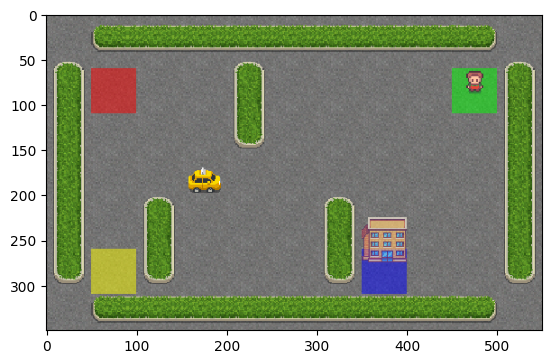

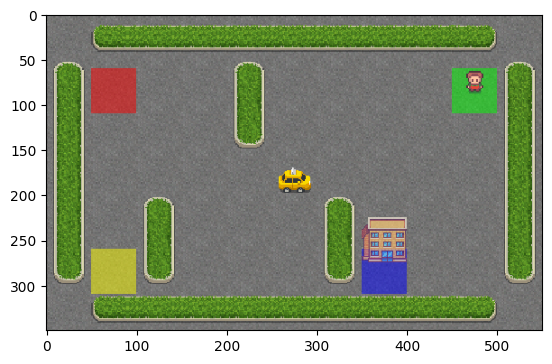

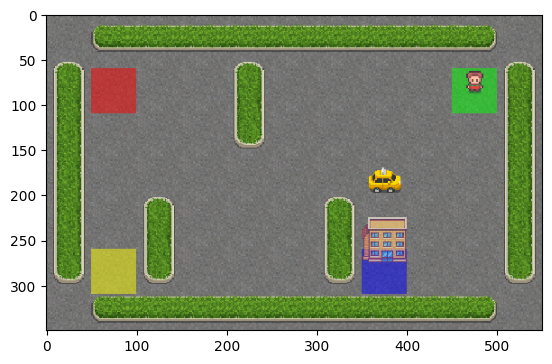

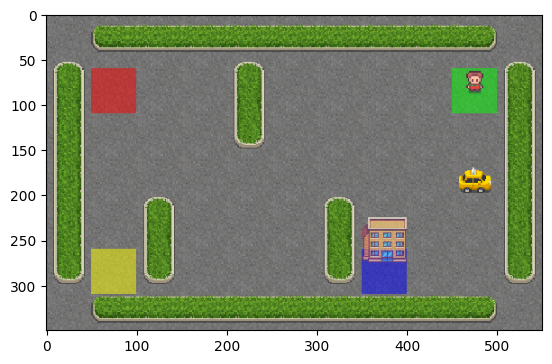

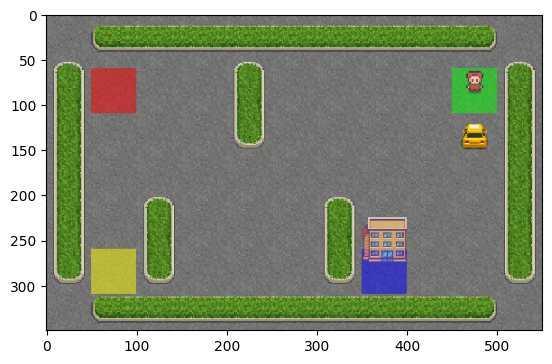

...

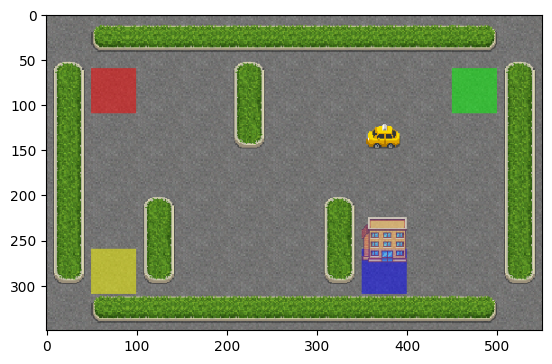

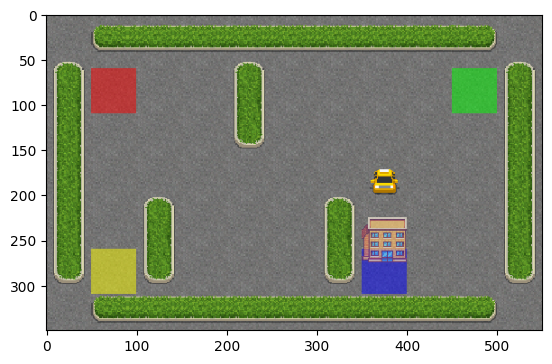

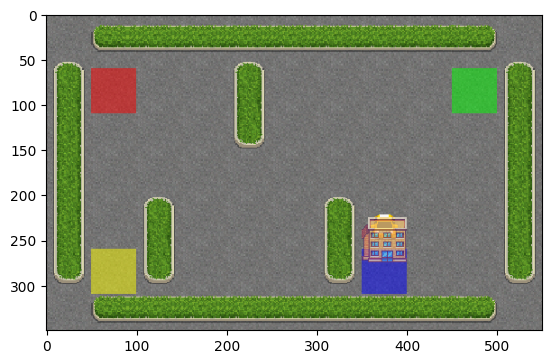

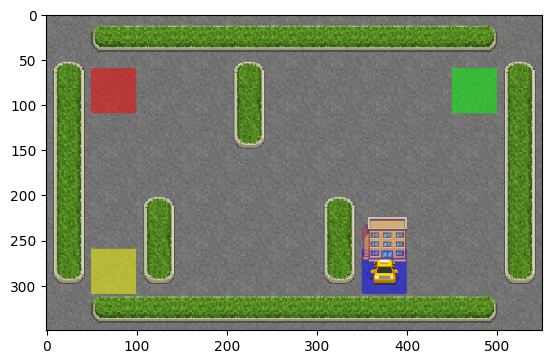

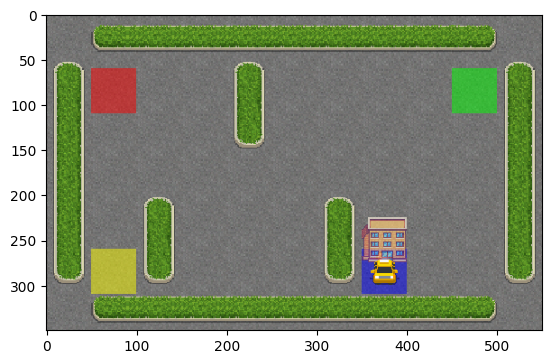

The program has ended
Q learning rewards of the test data  8


In [14]:
import gymnasium as gym
import random
import numpy as np
from os import system, name
from time import sleep
import pygame
import sys
import matplotlib.pyplot as plt
import time

class QAlgorithm:
    def __init__(self):
        self.env =  gym.make("Taxi-v3",render_mode="rgb_array")
        
        self.Qtable = np.zeros([self.env.observation_space.n, self.env.action_space.n])
        
        self.number_of_training_episodes = 5000 
        
        self.alpha = 0.1 
        self.gamma = 0.6
        self.epsilon = 0.1 
        self.Q_reward_array=[]
    def Qtraining(self):
        for i in range(self.number_of_training_episodes):
            self.position = self.env.reset()[0] 
            self.completed = False
            self.Q_reward =  0
            self.total_reward=0
            while not self.completed:
                if random.uniform(0, 1) < self.epsilon:
                    self.activity = self.env.action_space.sample() 
                else:
                    self.activity = np.argmax(self.Qtable[self.position]) 
        
                self.next_position, self.Q_reward, self.completed,_,_ = self.env.step(self.activity) 
                
                self.old_value = self.Qtable[self.position, self.activity] 
                self.next_max = np.max(self.Qtable[self.next_position])
        
                self.new_value = (1 - self.alpha) * self.old_value + self.alpha * (self.Q_reward + self.gamma * self.next_max)
                self.Qtable[self.position, self.activity] = self.new_value
                self.total_reward+=self.Q_reward
        
                self.position = self.next_position
            self.Q_reward_array.append(self.total_reward)
        return self.Q_reward_array
        
    def Qtesting(self):
                
        pygame.init()
        
        
        screen = pygame.display.set_mode((250, 250))
        pygame.display.set_caption("Taxi system")
        
        # Set up colors
        white = (255, 255, 255)
        
        
            
        self.position = self.env.reset()[0]
        self.Q_reward =  0
        self.completed = False
        self.rewards=0
        time.sleep(0.6)
        running = True
        try:
            while running:
                for event in pygame.event.get():
                    if event.type == pygame.QUIT:
                        running = False
                        pygame.quit()
                        sys.exit()
                    elif event.type == pygame.MOUSEBUTTONDOWN:
                        running = False
                        pygame.quit()
                        sys.exit()
                    elif self.completed:
                        running = False
                        pygame.quit()
                        sys.exit()
                while not self.completed:
                    self.activity = np.argmax(self.Qtable[self.position])
                    self.position, self.Q_reward, self.completed,_,_ = self.env.step(self.activity)
            
                    self.rewards+=self.Q_reward
                    self.robotaxiImage= (self.env.render())
                    self.surfarray = pygame.surfarray.make_surface(self.robotaxiImage.swapaxes(0, 1))
                    surfarray = pygame.transform.scale(self.surfarray, (250, 250))
                    plt.imshow(self.robotaxiImage)
                    plt.show()
                    screen.blit(surfarray, (0, 0))
                
                    pygame.display.flip()
        except SystemExit:
            print("The program has ended")
        
        return self.rewards        
    def q_testing_without_image(self, position):
        self.env.reset()
        self.Q_reward =  0
        self.completed = False
        self.rewards=0
        self.position=position
        while not self.completed:
                self.activity = np.argmax(self.Qtable[self.position])
                self.position, self.Q_reward, self.completed,_,_ = self.env.step(self.activity)
        
                self.rewards+=self.Q_reward
        return self.rewards
    
q_algorithm =QAlgorithm()

Q_learning_start_time = time.time()
Q_learning_training_rewards=q_algorithm.Qtraining()
Q_learning_end_time = time.time()

Q_learning_elapsed_time = Q_learning_end_time - Q_learning_start_time
Q_algorithm_rewards=q_algorithm.Qtesting()
print("Q learning rewards of the test data  "+str(Q_algorithm_rewards))

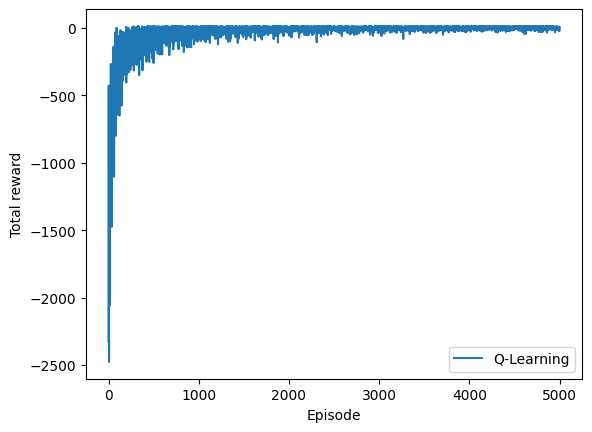

In [8]:
plt.plot(Q_learning_training_rewards, label="Q-Learning")
plt.xlabel("Episode")
plt.ylabel("Total reward")
plt.legend()
plt.show()

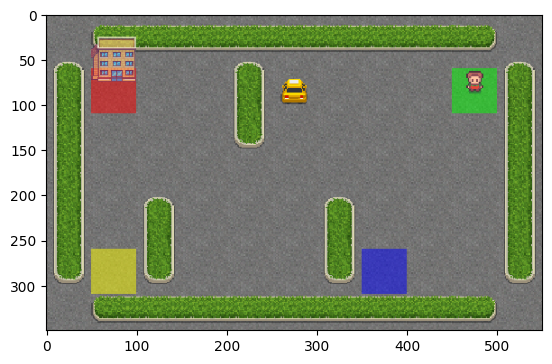

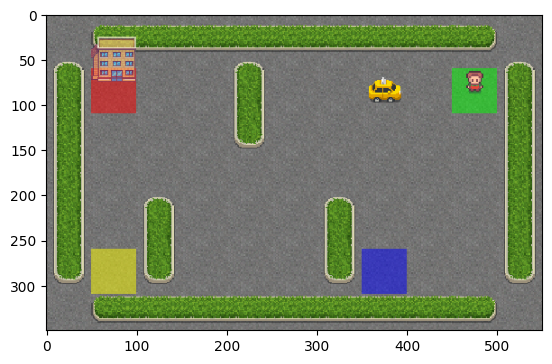

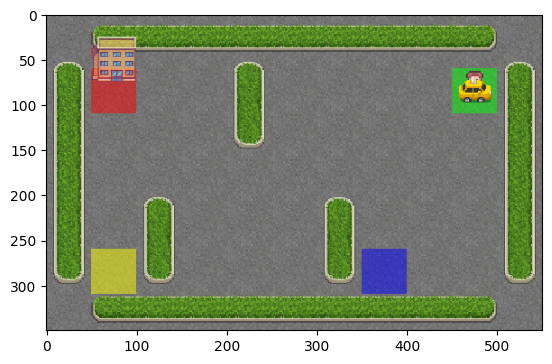

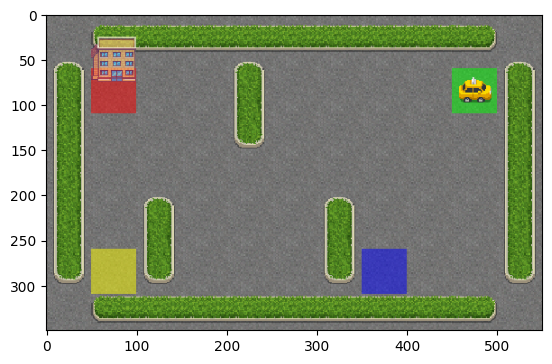

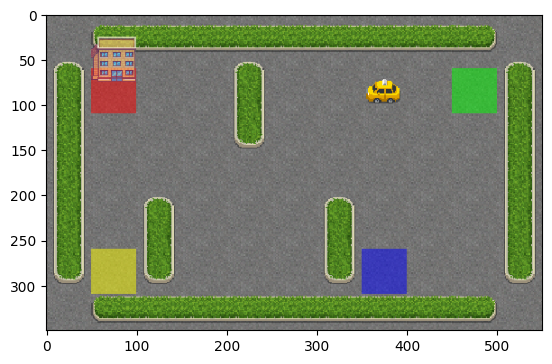

...

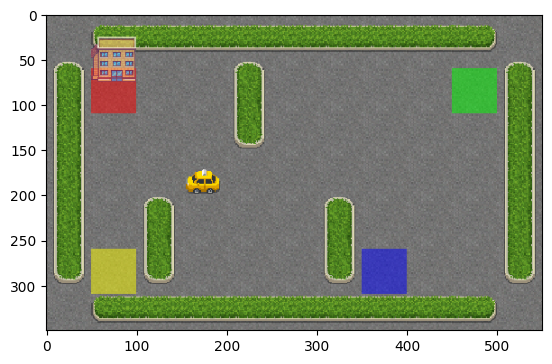

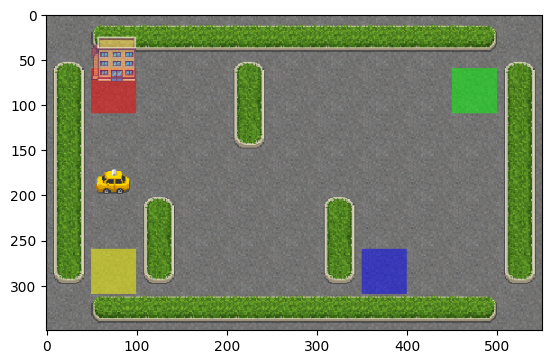

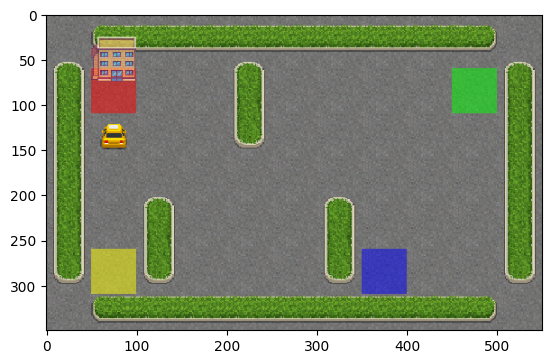

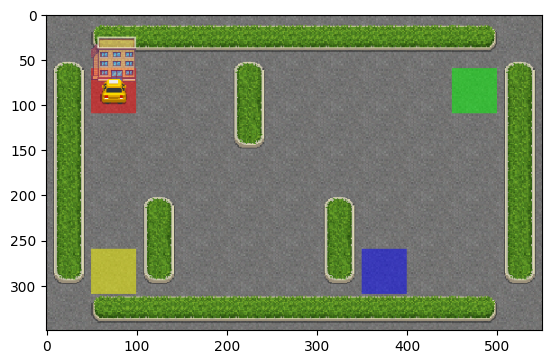

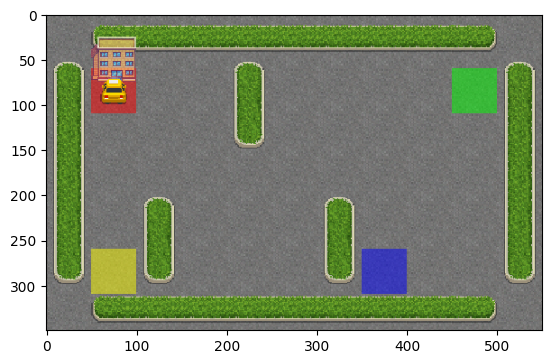

The program has ended
For the SARSA test run after the training we recieved the accuracy of  8
Average reward over the runs: 


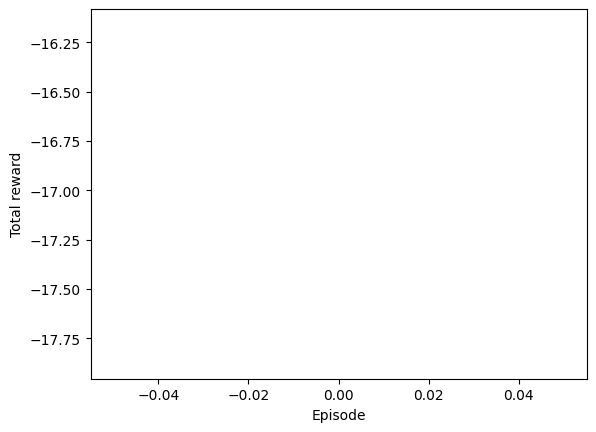

----------------------------------


NameError: name 'sarsa_best_episode_rewards' is not defined

In [15]:
import random
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import clear_output
import pygame
import sys
import gymnasium as gym
import time

class SARSA_Algorithm:
    def __init__(self):
        self.env = gym.make("Taxi-v3",render_mode="rgb_array")
        self.SARSA_table = np.zeros((self.env.observation_space.n, self.env.action_space.n))
        self.alpha=0.5
        self.gamma=0.95 
        self.epsilon=0.1

    def SARSA_choose_activity(self, position): 
        if random.uniform(0, 1) < self.epsilon:
            activity = self.env.action_space.sample()
        else:
            activity = np.argmax(self.SARSA_table[position, :])
        return activity
    
    def SARSA_learn(self, position, activity, SARSA_reward, next_position, next_activity):
        
        self.SARSA_table[position, activity] = self.SARSA_table[position, activity] + self.alpha * (SARSA_reward + self.gamma * self.SARSA_table[next_position, next_activity] - self.SARSA_table[position, activity])
        
    def SARSA_run(self, num_episodes=1000):
        SARSA_rewards = []
        SARSA_best_episode_reward = -1000
        best_episode = 0
        for episode in range(num_episodes):
            position = self.env.reset()[0]
            completed = False
            SARSA_total_reward = 0
            
            activity = self.SARSA_choose_activity(position)
            while not completed:
                next_position, SARSA_reward, completed,_, info = self.env.step(activity)
                next_activity = self.SARSA_choose_activity(next_position) 
                self.SARSA_learn(position, activity, SARSA_reward, next_position, next_activity) 
                position = next_position 
                
                activity = next_activity 
                SARSA_total_reward += SARSA_reward 
            SARSA_rewards.append(SARSA_total_reward)
            
        return SARSA_rewards
    def SARSA_testrun(self):
        SARSA_final_reward=0
        position=self.env.reset()[0]
        activity = self.SARSA_choose_activity(position)
        pygame.init()
        screen = pygame.display.set_mode((250, 250))
        pygame.display.set_caption("Taxi System using SARSA Algorithm")
        env = gym.make("Taxi-v3",render_mode="rgb_array").env
        
        white = (255, 255, 255)
        completed=False
        time.sleep(0.6)
        running = True
        try:
            while running:
                for event in pygame.event.get():
                    if event.type == pygame.QUIT:
                        running = False
                        pygame.quit()
                        sys.exit()
                    elif event.type == pygame.MOUSEBUTTONDOWN:
                        running = False
                        pygame.quit()
                        sys.exit()
                    elif completed:
                        running = False
                        pygame.quit()
                        sys.exit()
                while not completed:
                    next_position, SARSA_reward, completed,_,_ = self.env.step(activity)
                    next_activity = self.SARSA_choose_activity(next_position)
                    SARSA_final_reward+=SARSA_reward
                    position=next_position
                    activity=next_activity
                    robotaxiImage=self.env.render()
                    surfarray = pygame.surfarray.make_surface(robotaxiImage.swapaxes(0, 1))
                    surfarray = pygame.transform.scale(surfarray, (250, 250))
                
                    screen.blit(surfarray, (0, 0))
                
                    pygame.display.flip()
                    plt.imshow(robotaxiImage)
                    plt.show()
        except SystemExit:
            print("The program has ended")
        
        return SARSA_final_reward
        
        def SARSA_testrun_without_image(self,position):
            self.env.reset()
            SARSA_final_reward=0
            activity = self.SARSA_choose_activity(position)
            completed=False
            while not completed:
                next_position, SARSA_reward, completed,_,_ = self.env.step(activity)
                next_activity = self.SARSA_choose_activity(next_position)
                SARSA_final_reward+=SARSA_reward
                position=next_position
                activity=next_activity
        return SARSA_final_reward
            
def SARSA_plot_rewards(SARSA_rewards):
    plt.plot(SARSA_rewards)
    plt.xlabel("Episode")
    plt.ylabel("Total reward")
    plt.show()

num_episodes = 5000

Sarsa_start_time = time.time()
sarsa_algorithm = SARSA_Algorithm() 
sarsa_rewards = sarsa_algorithm.SARSA_run(num_episodes)
Sarsa_end_time = time.time()

Sarsa_elapsed_time = Sarsa_end_time - Sarsa_start_time
SARSA_final_reward=sarsa_algorithm.SARSA_testrun()
print("For the SARSA test run after the training we recieved the accuracy of ",SARSA_final_reward)


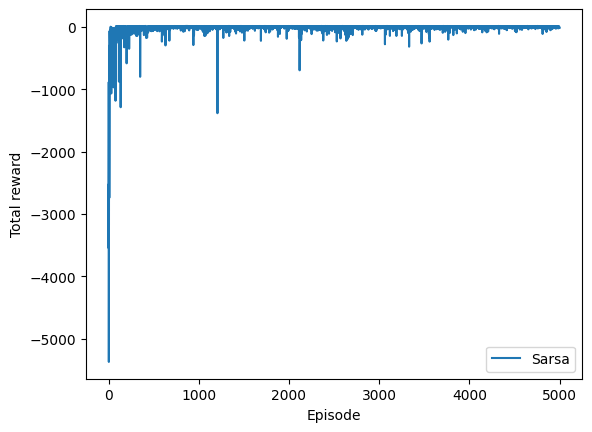

In [10]:
plt.plot(sarsa_rewards, label="Sarsa")
plt.xlabel("Episode")
plt.ylabel("Total reward")
plt.legend()
plt.show()

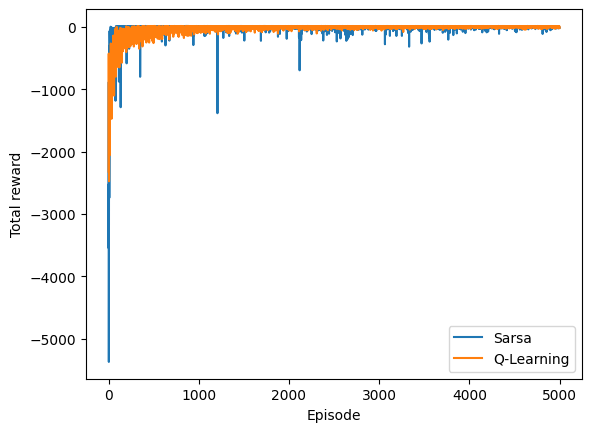

In [11]:
plt.plot(sarsa_rewards, label="Sarsa")
plt.plot(Q_learning_training_rewards, label="Q-Learning")
plt.xlabel("Episode")
plt.ylabel("Total reward")
plt.legend()
plt.show()

In [12]:
print("Time taken to train the Q Learning Algorithm  "+str(Q_learning_elapsed_time))
print("Time taken to train The SARSA Algorithm  "+str(Sarsa_elapsed_time))

Time taken to train the Q Learning Algorithm  6.920063734054565
Time taken to train The SARSA Algorithm  3.286423683166504
